In [15]:
import os, random

from sys import path
code_dir = os.path.join(os.path.abspath("."), "Programmation")
path.append (code_dir)
data_dir = '/Users/isabelleguyon/Documents/Projects/UCB_course/Baiyu_fingerprints/Cedric/fingerprint-master-sep2/PreProcessed/'

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import InterfacePreprocessing as IntPre

from PIL import Image
from scipy.ndimage import imread
from scipy.misc import imresize
from sklearn.metrics import roc_curve, auc

%matplotlib inline

In [72]:
# Create the same image merge with maximum 3 kind of pre-processing
def preprocessing_bare(image, size):
    
    if raw_only:
        image_temp = np.zeros((size,size,1))
        image = imresize(image, [size, size])
        image_temp[:,:,0] = image
    else:
        image_temp = np.zeros((size,size,4))
        image = imresize(image, [size, size]).astype(np.int32)
        image_temp[:,:,0] = image # 180*180
        image_temp[:,:,1] = imresize(IntPre.frequency(image, step=5), [size, size])
        image_temp[:,:,2] = imresize(np.abs(IntPre.orientation(image, coherence=False)), [size, size])
        image_temp[:,:,3] = imresize(IntPre.variance(image, block=5), [size, size])
        
#        OrMap = np.abs(IntPre.orientation(image, coherence=False))
#        Image.fromarray(255.0*(OrMap-np.min(OrMap))/np.max(OrMap)).show()
        
    return image_temp

def load_vrac(path):
    images = dict()

    for f in os.listdir(path):
        ID = f[:-6]
        if not images.has_key(ID):
            image_temp = np.zeros((image_size,image_size,6))
            
            image_temp[:,:,0] = imresize(imread(path + ID + "_0.png"), [image_size, image_size])
            image_temp[:,:,1] = imresize(imread(path + ID + "_1.png"), [image_size, image_size])
            image_temp[:,:,2] = imresize(imread(path + ID + "_2.png"), [image_size, image_size])
            image_temp[:,:,3] = imresize(imread(path + ID + "_3.png"), [image_size, image_size])
            image_temp[:,:,4] = imresize(imread(path + ID + "_4.png"), [image_size, image_size])
            image_temp[:,:,5] = imresize(imread(path + ID + "_5.png"), [image_size, image_size])
            
            images[ID] = image_temp
    return images

# To load images organised by pairs (of match and mismatch)
def load_pairs(path_match, path_mismatch):
    return load_vrac(path_match), load_vrac(path_mismatch)

In [62]:
# # If images are loaded with "load_pairs"
# def generate_batch_pairs(images_match, images_mismatch, num, image_size):
        
#     x = np.zeros((num, image_size*image_size*num_layer))
#     x_p = np.zeros((num, image_size*image_size*num_layer))
#     y = np.zeros((num, 1))
#     match = int(np.round(num*0.5))
#     mis_match = num - match

#     keys_mismatch = images_mismatch.keys()
#     for i in range(mis_match):
#         ID = random.choice(keys_mismatch)[:-1]
#         img = images_mismatch[ID + '0']
#         img_p = images_mismatch[ID + '1']
#         x[i,:] = np.reshape(img, (1,image_size*image_size*num_layer))
#         x_p[i,:] = np.reshape(img_p, (1,image_size*image_size*num_layer))
#         y[i] = 0

#     keys_match = images_match.keys()
#     for i in range(match):
#         ID = random.choice(keys_match)[:-1]
#         img = images_match[ID + '0']
#         img_p = images_match[ID + '1']
#         x[mis_match+i,:] = np.reshape(img, (1,image_size*image_size*num_layer))
#         x_p[mis_match+i,:] = np.reshape(img_p, (1,image_size*image_size*num_layer))
#         y[mis_match+i] = 1

# #     # Below just for testing!!!
# #     keys_mismatch = images_mismatch.keys()
# #     for i in range(num):
# #         ID = random.choice(keys_mismatch)[:-1]
# #         img = images_match[ID+'0']
# #         img_shifted = np.copy(img)
        
# #         img_shifted = np.rot90(img_shifted)
# # #         for h in range(img.shape[0]):
# # #             for w in range(img.shape[0]-10):
# # #                 img_shifted[h,w] = img_shifted[h,w+30]
                
# #         x[mis_match+i,:] = np.reshape(img, (1,image_size*image_size*4))
# #         x_p[mis_match+i,:] = np.reshape(img_shifted, (1,image_size*image_size*4))
# #         y[mis_match+i] = 0   
        
        
#     return [x, x_p, y]

In [73]:
# If images are loaded with "load_pairs"
def generate_batch_pairs(images_match, images_mismatch, num, image_size):
        
    x = np.zeros((num, image_size*image_size*num_layer))
    x_p = np.zeros((num, image_size*image_size*num_layer))
    y = np.zeros((num, 1))
    match = int(np.round(num*0.5))
    mis_match = num - match

    keys_mismatch = images_mismatch.keys()
    for i in range(mis_match):
        ID = random.choice(keys_mismatch)[:-1]
        x1 = images_mismatch[ID + '0'][:,:,:]
        x2 = images_mismatch[ID + '1'][:,:,:]
        x[i,:] = np.reshape(x1, (1,image_size*image_size*num_layer))
        x_p[i,:] = np.reshape(x2, (1,image_size*image_size*num_layer))
        y[i] = 0

    keys_match = images_match.keys()
    for i in range(match):
        ID = random.choice(keys_match)[:-1]
        x1 = images_match[ID + '0'][:,:,:]
        x2 = images_match[ID + '1'][:,:,:]
        x[mis_match+i,:] = np.reshape(x1, (1,image_size*image_size*num_layer))
        x_p[mis_match+i,:] = np.reshape(x2, (1,image_size*image_size*num_layer))
        y[mis_match+i] = 1

#     # Below just for testing!!!
#     keys_mismatch = images_mismatch.keys()
#     for i in range(num):
#         ID = random.choice(keys_mismatch)[:-1]
#         img = images_match[ID+'0']
#         img_shifted = np.copy(img)
        
#         img_shifted = np.rot90(img_shifted)
# #         for h in range(img.shape[0]):
# #             for w in range(img.shape[0]-10):
# #                 img_shifted[h,w] = img_shifted[h,w+30]
                
#         x[mis_match+i,:] = np.reshape(img, (1,image_size*image_size*4))
#         x_p[mis_match+i,:] = np.reshape(img_shifted, (1,image_size*image_size*4))
#         y[mis_match+i] = 0   
        
        
    return [x, x_p, y]

In [74]:
def weight_variable(shape):
    initial = tf.constant(0.3, shape=shape)
    return tf.Variable(initial)

def bias_variable(shape):
    initial = tf.constant(0.3, shape=shape)
    return tf.Variable(initial)

def assist_variable(shape):
    initial = tf.constant(0.3, shape=shape)
    return tf.Variable(initial)

def conv2d(x, W, stride=[1, 1, 1, 1]):
    return tf.nn.conv2d(x, W, strides=stride, padding='SAME')

def max_pool_2x2(x):
    return tf.nn.max_pool(x, ksize=[1, 2, 2, 1],
                        strides=[1, 2, 2, 1], padding='SAME')
def sigm(x):
    return tf.sigmoid(x)

In [75]:
# The three variables below are global variables and they can be read everywhere

global raw_only, image_size, num_layer
raw_only = False
raw_image_size = 180
image_size= 88
if raw_only:
    num_layer = 1
else:
    num_layer = 6

p_matching = 0.5
num_filter_1 = 16
num_filter_2 = 64
num_filter_3 = 256

# images = load_vrac('/home/cedric/Bureau/Sample/')
images_match, images_mismatch = load_pairs(os.path.join(data_dir, "Match/"), os.path.join(data_dir, "Mismatch/"))

# Creating a new TF session

In [56]:
import tensorflow as tf
sess = tf.InteractiveSession()

# These two are input images
x = tf.placeholder(tf.float32, shape=[None, image_size*image_size*num_layer])
x_p = tf.placeholder(tf.float32, shape=[None, image_size*image_size*num_layer])

# y_ is just a value 0(match) or 1(no match) for the two input images
y_ = tf.placeholder(tf.float32, shape=[None, 1])

# Dropout coefficient
keep_prob = tf.placeholder(tf.float32)

sess.run(tf.initialize_all_variables())

ImportError: No module named tensorflow

# Defining Shared Weights

In [57]:
W_conv1 = weight_variable([7, 7, num_layer, num_filter_1])
b_conv1 = bias_variable([num_filter_1])

W_conv2 = weight_variable([5, 5, num_filter_1, num_filter_2])
b_conv2 = bias_variable([num_filter_2])

W_conv3 = weight_variable([5, 5, num_filter_2, num_filter_3])
b_conv3 = bias_variable([num_filter_3])

W_conv1_p = weight_variable([7, 7, num_layer, num_filter_1])
b_conv1_p = bias_variable([num_filter_1])

W_conv2_p = weight_variable([5, 5, num_filter_1, num_filter_2])
b_conv2_p = bias_variable([num_filter_2])

W_conv3_p = weight_variable([5, 5, num_filter_2, num_filter_3])
b_conv3_p = bias_variable([num_filter_3])

NameError: global name 'tf' is not defined

# Two Sides of Siamese Net

In [58]:
# Side 1
# Input Image
x_image = tf.reshape(x, [-1,image_size,image_size,num_layer])

# First Conv Layer
h_conv1 = tf.nn.relu(conv2d(x_image, W_conv1) + b_conv1)
h_pool1 = max_pool_2x2(h_conv1)

# Second Conv Layer
h_conv2 = tf.nn.relu(conv2d(h_pool1, W_conv2) + b_conv2)
h_pool2 = max_pool_2x2(h_conv2)

# Third Conv Layer
h_conv3 = tf.nn.relu(conv2d(h_pool2, W_conv3) + b_conv3)
h_pool3 = max_pool_2x2(h_conv3)

# Final Data Processing Step
z = tf.reshape(h_pool3, [-1,30976])
z_norm = tf.pow(tf.reduce_sum(tf.pow(z, 2), reduction_indices=1),0.5)

# Side 2
# Input Image
x_image_p = tf.reshape(x_p, [-1,image_size,image_size,num_layer])

# First Conv Layer - after maxpool 44*44
h_conv1_p = tf.nn.relu(conv2d(x_image_p, W_conv1_p) + b_conv1_p)
h_pool1_p = max_pool_2x2(h_conv1_p)

# Second Conv Layer - after maxpool 22*22
h_conv2_p = tf.nn.relu(conv2d(h_pool1_p, W_conv2_p) + b_conv2_p)
h_pool2_p = max_pool_2x2(h_conv2_p)

# Second Conv Layer - after maxpool 22*22
h_conv3_p = tf.nn.relu(conv2d(h_pool2_p, W_conv3_p) + b_conv3_p)
h_pool3_p = max_pool_2x2(h_conv3_p)

# Final Data Processing Step
z_p = tf.reshape(h_pool3_p, [-1,30976])
z_p_norm = tf.pow(tf.reduce_sum(tf.pow(z_p, 2), reduction_indices=1),0.5)

NameError: name 'tf' is not defined

# Simple Fully Connected Layer

In [59]:
# dz = z - z_p

# # First flatten it
# dz_flat = tf.reshape(dz, [-1,22*22*num_filter_2])

# y_fc1 = tf.nn.softmax(tf.matmul(dz_flat, W_fc1) + b_fc1)

# keep_prob = tf.placeholder(tf.float32)
# h_fc2_drop = tf.nn.dropout(y_fc1, keep_prob)

# y_readout = tf.nn.softmax(tf.matmul(h_fc2_drop, W_fc2) + b_fc2)

# Actual Calculation

In [60]:
cross_entropy = tf.div(tf.reduce_sum(z*z_p, reduction_indices=1), z_norm*z_p_norm)

train_step = tf.train.AdamOptimizer(1e-4).minimize(cross_entropy)

correct_prediction = tf.equal(tf.round(tf.mul(z, z_p)/tf.reduce_prod(z_norm*z_p_norm)), y_)
accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

sess.run(tf.initialize_all_variables())

for i in range(500):
    batch = generate_batch_pairs(images_match, images_mismatch, 50, image_size)
    if i%100 == 0:
        train_accuracy = accuracy.eval(feed_dict={x:batch[0], x_p:batch[1], y_: batch[2], keep_prob: 1.0})
        print("step %d, training accuracy %g"%(i, train_accuracy))
    train_step.run(feed_dict={x:batch[0], x_p:batch[1], y_: batch[2], keep_prob: 1.0})

# batch = generate_batch_pairs(images_match, images_mismatch, 200, image_size)
# batch = simul_siamese(batch)

# print("Accuracy %g"%accuracy.eval(feed_dict={x:batch[0], x_p:batch[1], y_: batch[2], keep_prob: 1.0}))

# results = y_readout.eval(feed_dict={x:batch[0], x_p:batch[1], y_: batch[2], keep_prob: 1.0})[:,1]
# from PIL import Image
#     im = im.resize((newSize,newSize),Image.ANTIALIAS)show_ROC(batch[2][:,1], results)

NameError: name 'tf' is not defined

# Inspect Preprocessing

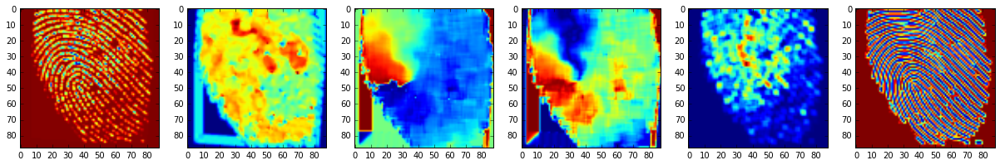

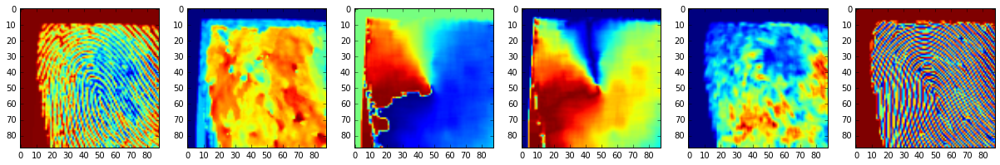

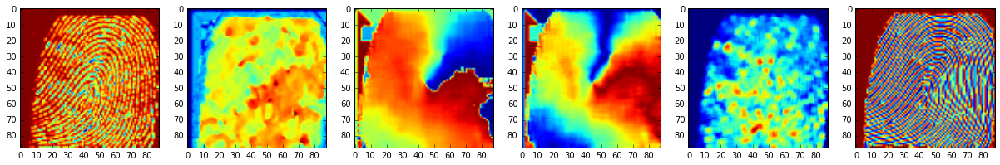

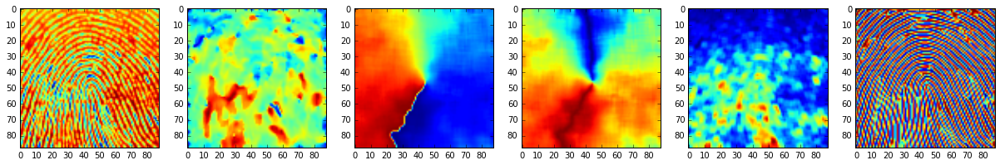

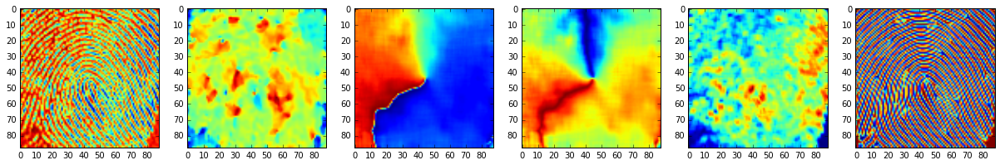

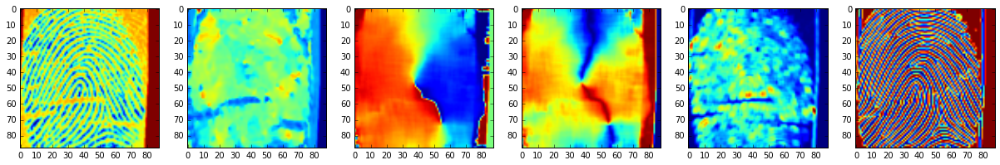

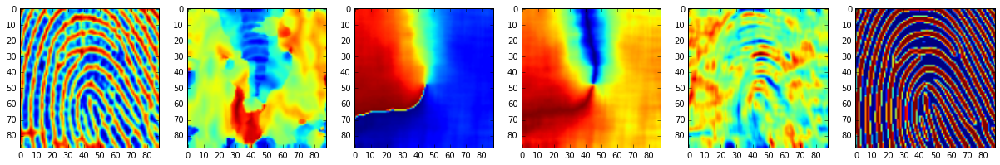

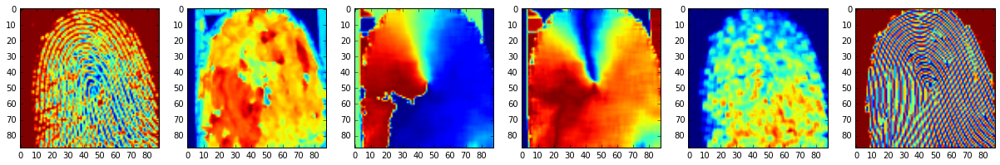

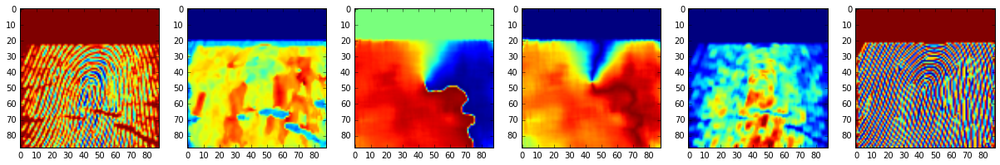

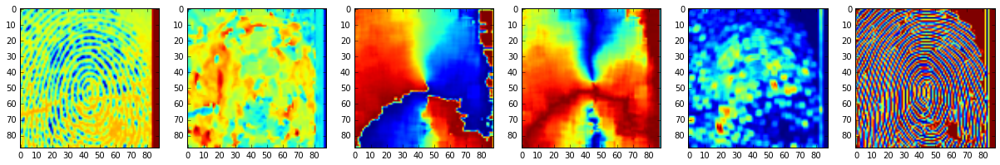

In [89]:
num=10 # This sets the number of examples to display <====
batch = generate_batch_pairs(images_match, images_mismatch, num, image_size)

# print("Accuracy %g" %accuracy.eval(feed_dict={x:batch[0], x_p:batch[1], y_: batch[2], keep_prob: 1.0}))

for i in range(num):
    plt.figure(figsize=(21,9))
    for j in range(6):
        ax = plt.subplot(1,6,j+1)
        ax.imshow(np.reshape(batch[0][i], (88,88,6))[:,:,j])

# This was commented out because tensor flow does not work
#results = cross_entropy.eval(feed_dict={x:batch[0], x_p:batch[1], y_: batch[2], keep_prob: 1.0})

#print results
#print batch[2]

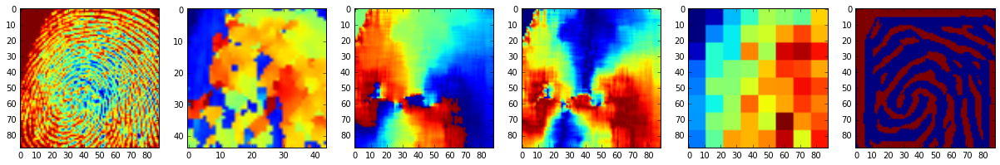

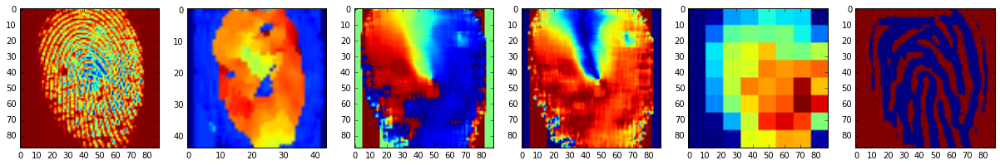

In [86]:
for i in range(num): # Note: ici on travaille sur l'image decoupee et reduite
    image = np.reshape(batch[0][i], (88,88,6))[:,:,0]
    freq = IntPre.frequency(image)
    (orient, coherence) = IntPre.orientation(image, coherence=True)
    abs_orient = np.abs(orient)
    var_map = IntPre.variance(image)
    gabor = IntPre.gabor(image)      
    plt.figure(figsize=(21,7))
    ax = plt.subplot(1,6,1); ax.imshow(image)
    ax = plt.subplot(1,6,2); ax.imshow(freq)
    ax = plt.subplot(1,6,3); ax.imshow(orient)
    ax = plt.subplot(1,6,4); ax.imshow(abs_orient)
    ax = plt.subplot(1,6,5); ax.imshow(var_map)
    ax = plt.subplot(1,6,6); ax.imshow(gabor)

# Compute similarity

[ 0.] 0.0779427305059
[ 0.] -0.028671493586
[ 0.] 0.097388061897
[ 0.] -0.101057636887
[ 0.] 0.142443083012
[ 1.] 0.291928594559
[ 1.] 0.431244924902
[ 1.] 0.430588569834
[ 1.] 0.338855379634
[ 1.] 0.694638113446


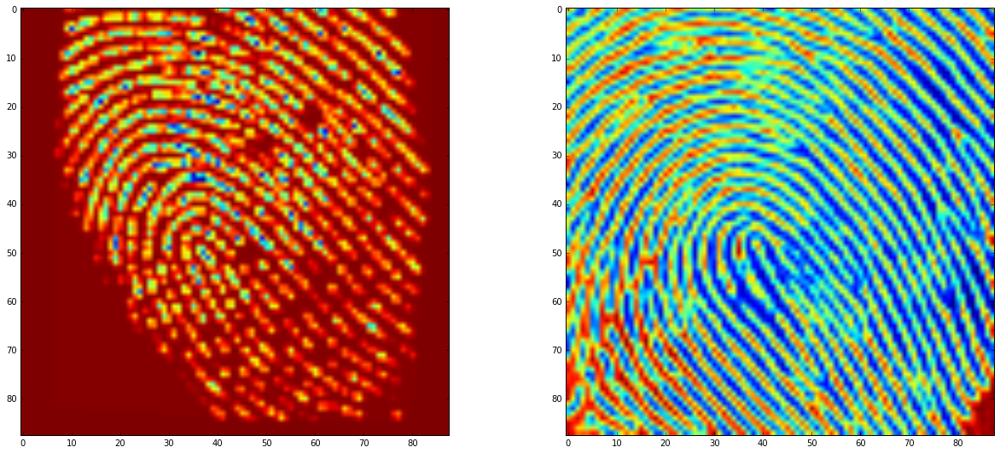

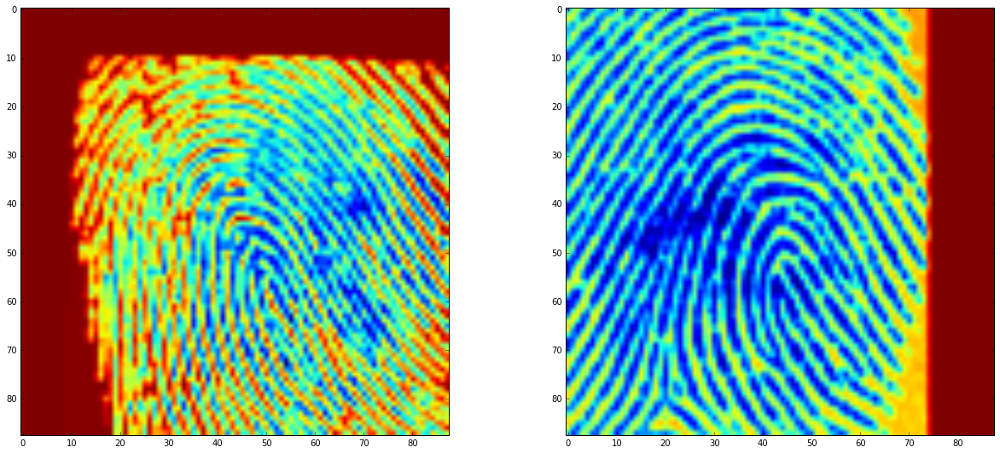

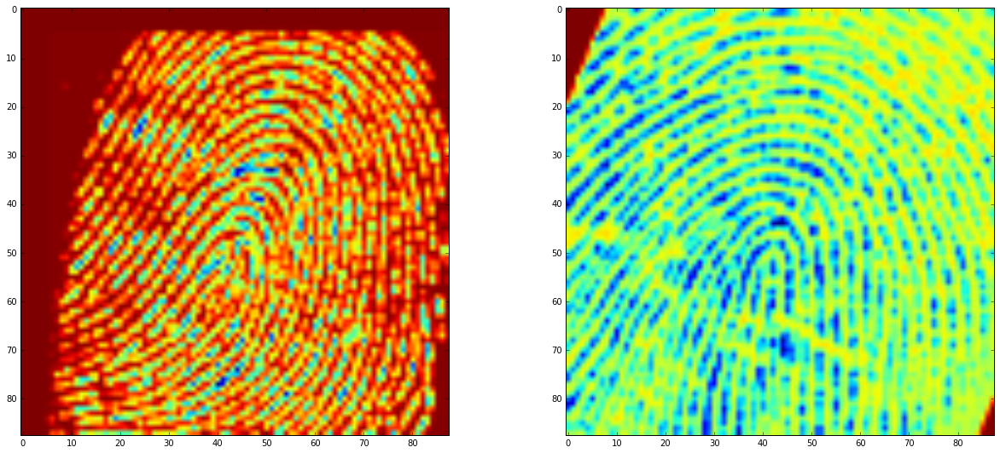

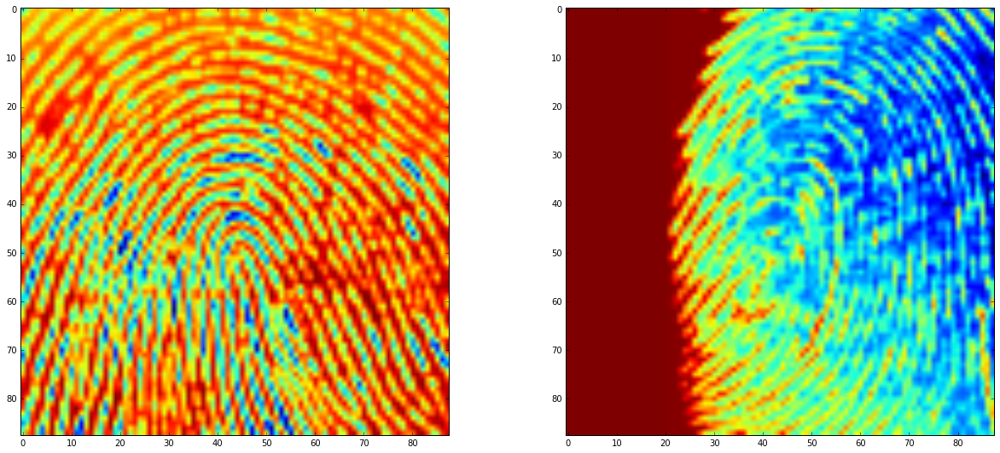

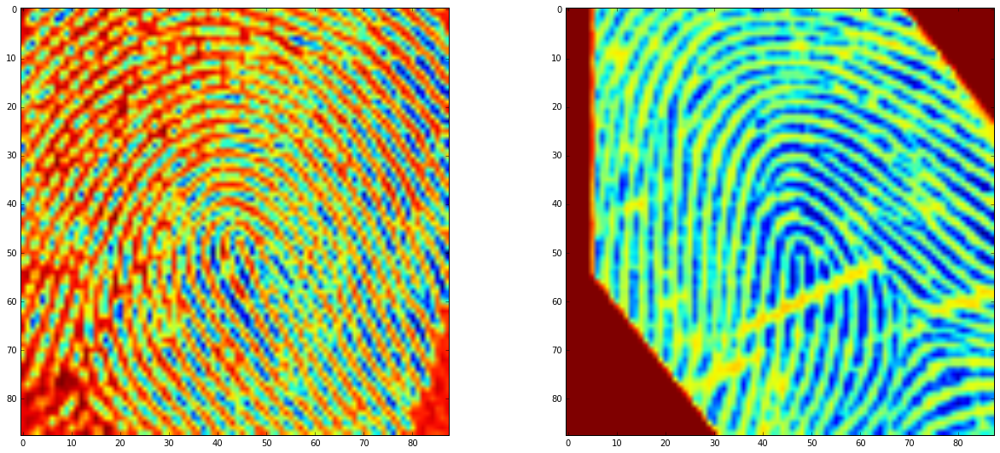

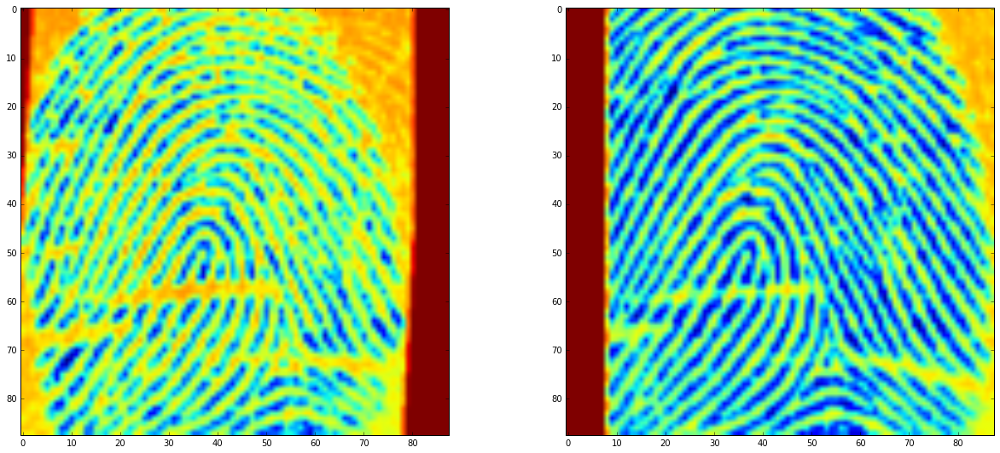

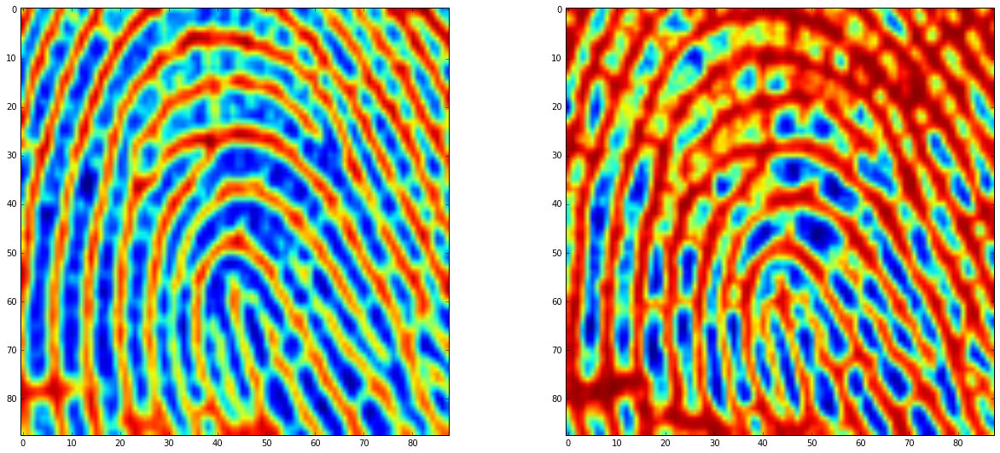

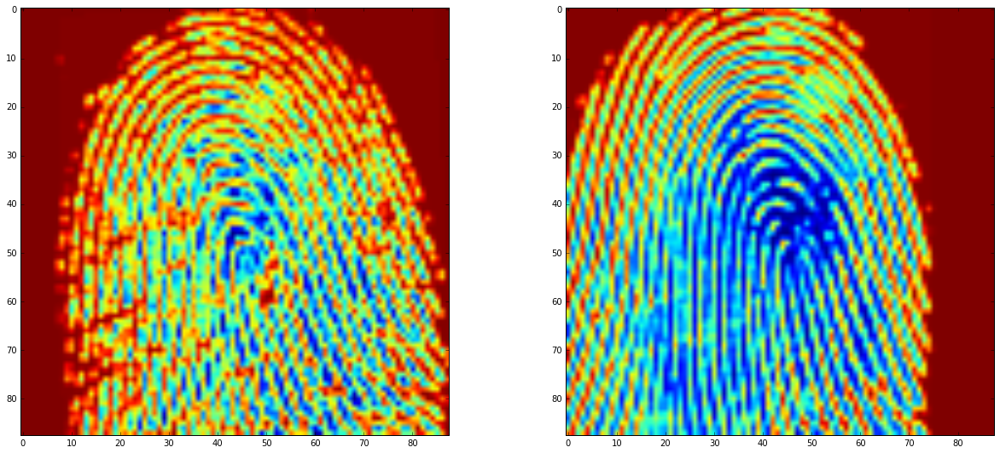

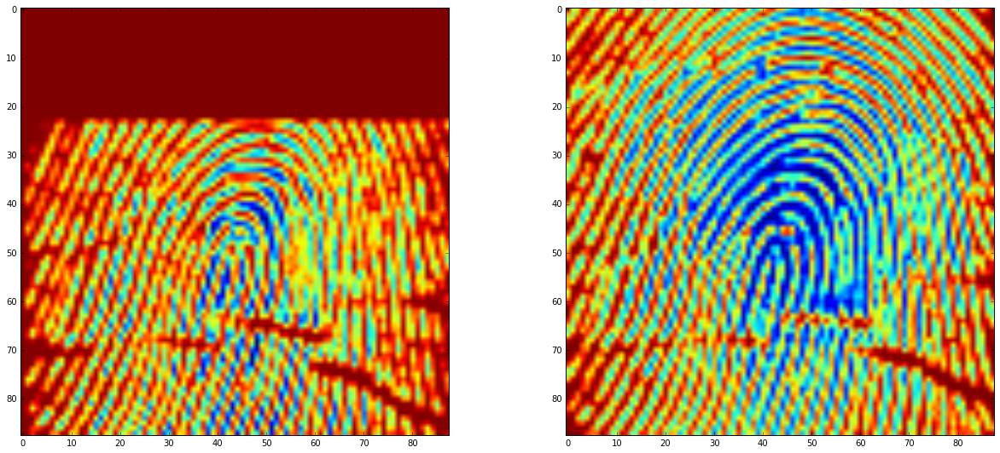

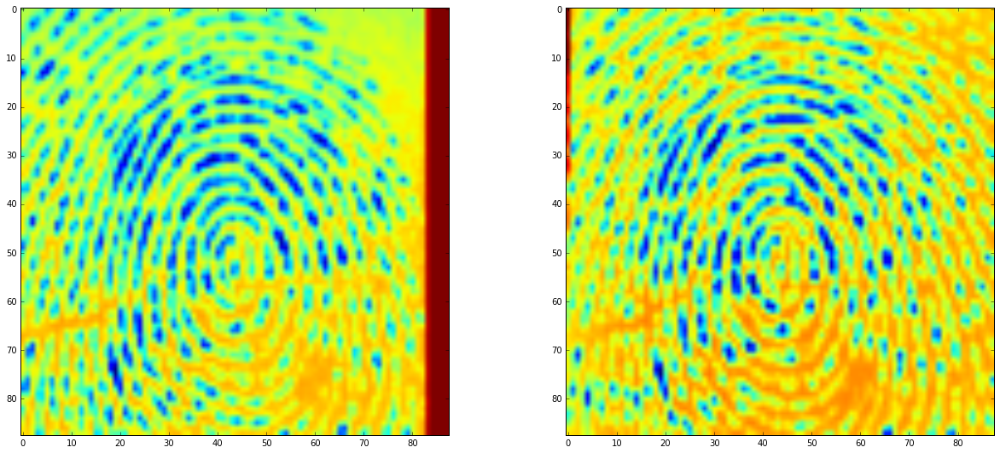

In [94]:
for i in range(num):
    plt.figure(figsize=(21,9))
    im1= np.reshape(batch[0][i], (88,88,6))[:,:,0]
    im2= np.reshape(batch[1][i], (88,88,6))[:,:,0]
    y = batch[2][i]
    n = np.prod(im1.shape)
    ax = plt.subplot(1,2,1)
    ax.imshow(im1)
    ax = plt.subplot(1,2,2)
    ax.imshow(im2)            
    print y, np.corrcoef(np.reshape(im1, n), np.reshape(im2, n))[0, 1]
 

# Compute ROC curve

In [99]:
def show_ROC(actual, predictions, title):
    false_positive_rate, true_positive_rate, thresholds = roc_curve(actual, predictions)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    
    plt.title(title)
    plt.plot(false_positive_rate, true_positive_rate, 'b',
    label='AUC = %0.2f'% roc_auc)
    plt.legend(loc='lower right')
    plt.plot([0,1],[0,1],'r--')
    plt.xlim([-0.1,1.2])
    plt.ylim([-0.1,1.2])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()

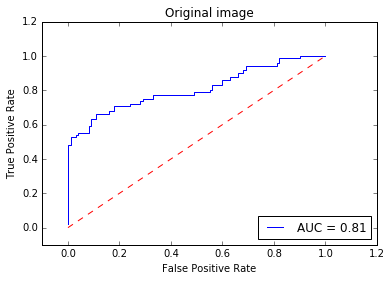

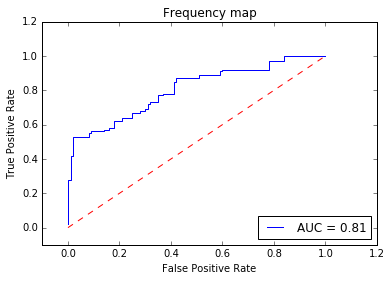

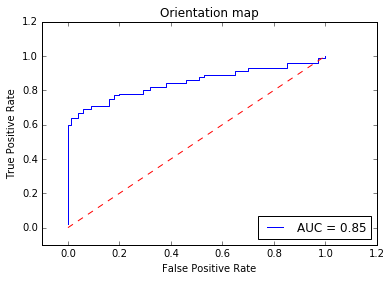

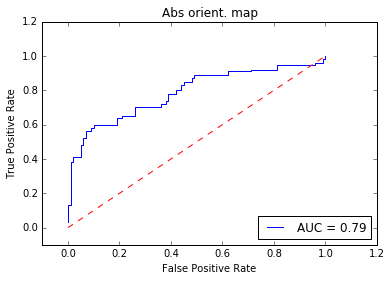

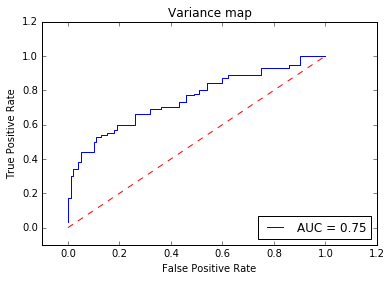

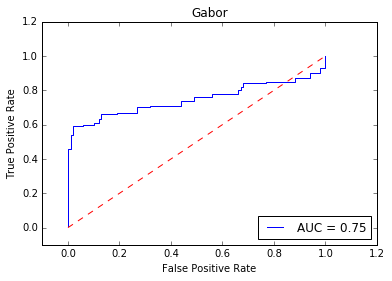

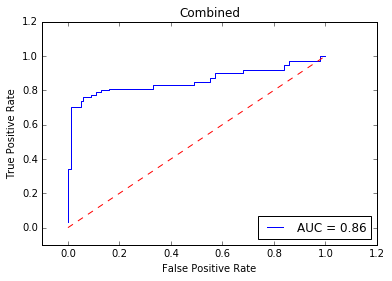

In [104]:
t = ['Original image', 'Frequency map', 'Orientation map', 'Abs orient. map', 'Variance map', 'Gabor']
im_num=200 
prepro_num=len(t)
batch = generate_batch_pairs(images_match, images_mismatch, im_num, image_size)
target = batch[2]
score = np.empty([prepro_num,im_num])
for j in range (prepro_num):
    for i in range(num):
        im1= np.reshape(batch[0][i], (88,88,6))[:,:,j]
        im2= np.reshape(batch[1][i], (88,88,6))[:,:,j]

        n = np.prod(im1.shape)       
        score[j][i] = np.corrcoef(np.reshape(im1, n), np.reshape(im2, n))[0, 1]

    show_ROC(target, score[j], t[j])

show_ROC(target, np.sum(score, axis=0), 'Combined')